<a href="https://colab.research.google.com/github/Kim-Yeonjoo/DeepLearning/blob/main/9_2_YOLOv8_Object_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#YOLO 라이브러리
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 910.1/910.1 kB 20.7 MB/s eta 0:00:00


In [2]:
import ultralytics

ultralytics.checks()# 버전 사용환경

Ultralytics 8.3.62 🚀 Python-3.11.11 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 30.8/112.6 GB disk)


# 테스트 이미지 display

In [4]:
import requests

# 이미지 URL
image_url = "https://images.squarespace-cdn.com/content/v1/56690c0ca128e6e00f021af6/1461148473502-9D3SLDUVC7J87LTG63SL/BEAD+Al+Bateen+street2.JPG"

# 저장할 파일 이름
output_file = "street2.jpg"

# 이미지 다운로드 및 저장
response = requests.get(image_url, stream=True)
if response.status_code == 200:
    with open(output_file, "wb") as file:
        file.write(response.content)
    print(f"이미지가 {output_file}로 저장되었습니다!")
else:
    print(f"이미지를 다운로드할 수 없습니다. 상태 코드: {response.status_code}")

이미지가 street2.jpg로 저장되었습니다!


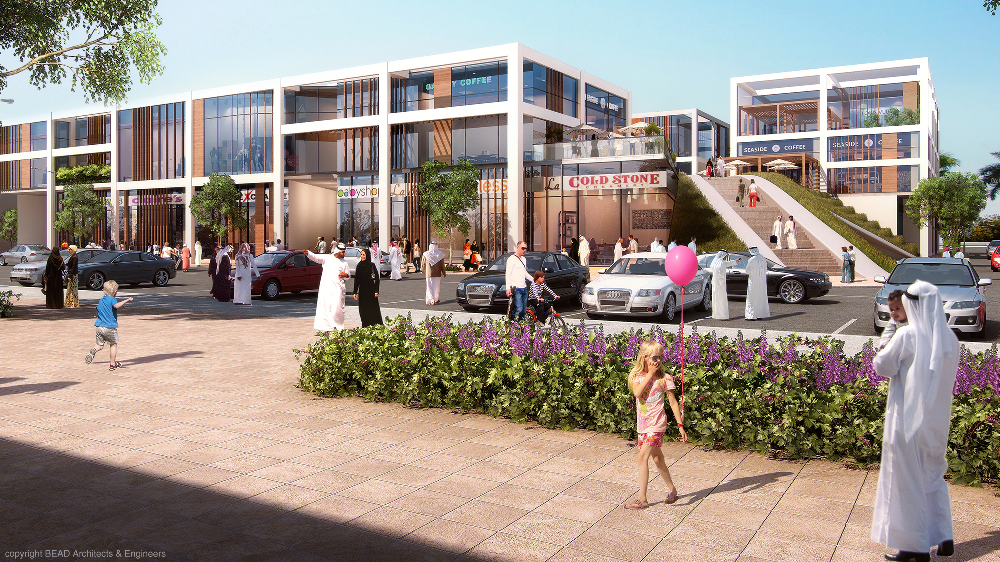

In [5]:
from PIL import Image # Pillow
from IPython.display import display

with Image.open(output_file) as test_image:
    display(test_image)

# 객체 탐지

In [6]:
from ultralytics import YOLO

# MS COCO 데이터셋 사전학습된 yolov8 모델 로드함
model = YOLO('yolov8n.pt')

100%|██████████| 6.25M/6.25M [00:00<00:00, 108MB/s]


In [7]:
print(type(model.names), len(model.names))
print(model.names)

<class 'dict'> 80
{0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'carrot', 52: 'hot dog', 53: 'pizza', 54: 'donut', 55: 'cake', 56: 'chair', 57: 'couch', 58: 'potted plant', 59: 'bed', 60: 'dining table', 61: 'toilet', 62: 'tv', 63: 'laptop', 64: 'mouse', 65: 'remote', 66: 'keyboard', 67: 'cell p

# 테스트 이미지에서 객체 탐지

In [8]:
results = model.predict(source='*.jpg', save=True)


image 1/1 /content/street2.jpg: 384x640 13 persons, 12 cars, 88.7ms
Speed: 10.5ms preprocess, 88.7ms inference, 759.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict


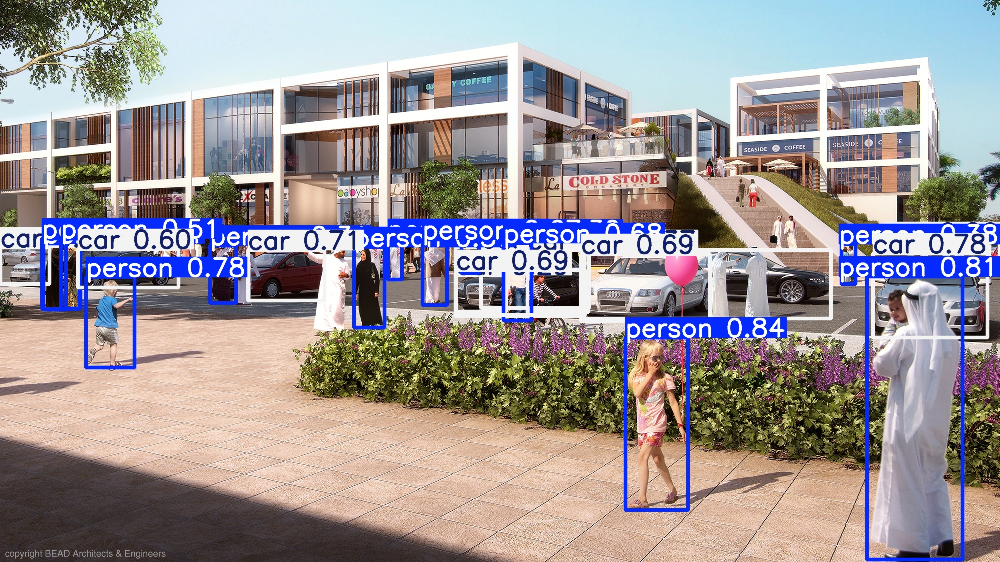

In [9]:
from PIL import Image
from IPython.display import display

with Image.open('/content/runs/detect/predict/'+output_file) as pred_image:
    # 이미지를 display 함수를 사용하여 표시합니다.
    display(pred_image)

In [10]:
# 자료형

import numpy as np

for result in results:

    uniq, cnt = np.unique(result.boxes.cls.cpu().numpy(), return_counts=True)  # Torch.Tensor -> numpy
    uniq_cnt_dict = dict(zip(uniq, cnt))

    print('\n{class num:counts} =', uniq_cnt_dict,'\n')

    for c in result.boxes.cls:
        print('class num =', int(c), ', class_name =', model.names[int(c)])


{class num:counts} = {0.0: 13, 2.0: 12} 

class num = 0 , class_name = person
class num = 0 , class_name = person
class num = 0 , class_name = person
class num = 2 , class_name = car
class num = 2 , class_name = car
class num = 2 , class_name = car
class num = 2 , class_name = car
class num = 0 , class_name = person
class num = 0 , class_name = person
class num = 2 , class_name = car
class num = 0 , class_name = person
class num = 0 , class_name = person
class num = 0 , class_name = person
class num = 0 , class_name = person
class num = 2 , class_name = car
class num = 0 , class_name = person
class num = 2 , class_name = car
class num = 2 , class_name = car
class num = 0 , class_name = person
class num = 0 , class_name = person
class num = 0 , class_name = person
class num = 2 , class_name = car
class num = 2 , class_name = car
class num = 2 , class_name = car
class num = 2 , class_name = car
